CS682 Project by Sourabh Kulkarni and Pradeep Ambati.

- Import clean image examples from imagenet
- Apply adversarial preturbations
- Pass through deep image prior based denoiser
- Compare adversarial and denoised images
- Use pretrained alexnet classifier to predict classes

Note: To see overfitting set `num_iter` to a large value.

# Import libs

In [1]:
from __future__ import print_function
import matplotlib.pyplot as plt
%matplotlib inline

import os
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

import numpy as np
from models import *

import torch
import torch.optim


from skimage.measure import compare_psnr
from utils.denoising_utils import *

torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark =True
dtype = torch.cuda.FloatTensor

imsize =-1
PLOT = True
sigma = 25
sigma_ = sigma/255.

torch.cuda.get_device_name(0)


'GeForce GTX 970M'

In [35]:
# enter filename 
#fname = 'data/denoising/explaining-adversarial-gibbon.jpg'
fname = 'data/denoising/cropped_map.jpg'


# Load image

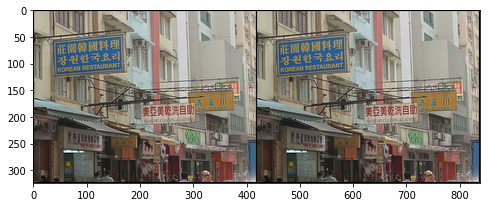

In [36]:
img_noisy_pil = crop_image(get_image(fname, imsize)[0], d=32)
img_noisy_np = pil_to_np(img_noisy_pil)

# As we don't have ground truth
img_pil = img_noisy_pil
img_np = img_noisy_np
img_pil = crop_image(get_image(fname, imsize)[0], d=32)
img_np = pil_to_np(img_pil)
    
#Add Extra Noise
#img_pil, img_np = get_noisy_image(img_np, sigma_)
if PLOT:
        plot_image_grid([img_np, img_noisy_np], 4, 6);

# Setup

In [54]:
INPUT = 'noise' # 'meshgrid'
pad = 'reflection'
OPT_OVER = 'net' # 'net,input'

reg_noise_std = 1./30. # set to 1./20. for sigma=50
LR = 0.01

OPTIMIZER='LBFGS' # 'LBFGS' 'adam'
show_every = 100
exp_weight=0.99


num_iter = 2400
input_depth = 3
figsize = 5 

net = skip(
            input_depth, 3, 
            num_channels_down = [8, 16, 32, 64, 128], 
            num_channels_up   = [8, 16, 32, 64, 128],
            num_channels_skip = [0, 0, 0, 4, 4], 
            upsample_mode='bilinear',
            need_sigmoid=True, need_bias=True, pad=pad, act_fun='LeakyReLU')

net = net.type(dtype)


net_input = get_noise(input_depth, INPUT, (img_pil.size[1], img_pil.size[0])).type(dtype).detach()

# Compute number of parameters
s  = sum([np.prod(list(p.size())) for p in net.parameters()]); 
print ('Number of params: %d' % s)

# Loss
mse = torch.nn.MSELoss().type(dtype)

img_noisy_torch = np_to_torch(img_noisy_np).type(dtype)

Number of params: 572827


# Optimize

C:\Anaconda2\envs\CS682\lib\site-packages\torch\nn\modules\upsampling.py:122: UserWarning: nn.Upsampling is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.Upsampling is deprecated. Use nn.functional.interpolate instead.")
C:\Anaconda2\envs\CS682\lib\site-packages\torch\nn\functional.py:1961: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


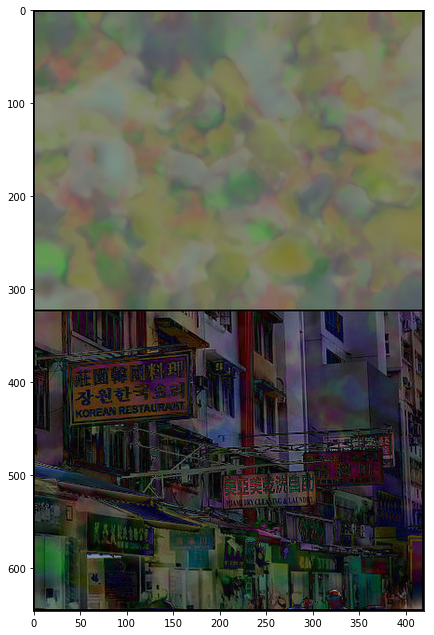

mean image 0.17082486


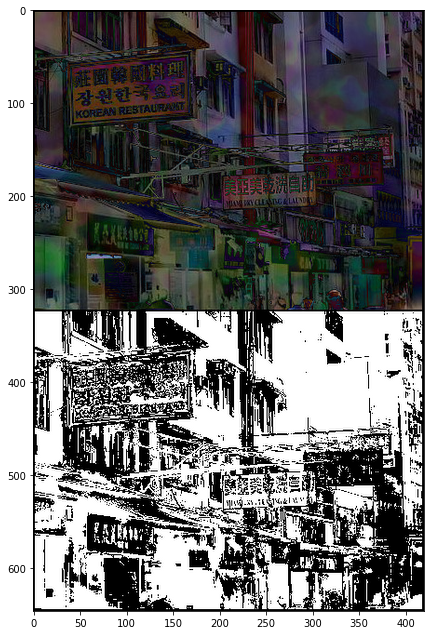

Starting optimization with LBFGS   PSNR_noisy: 17.405591   PSRN_gt: 17.405591 PSNR_gt_sm: 15.933098 


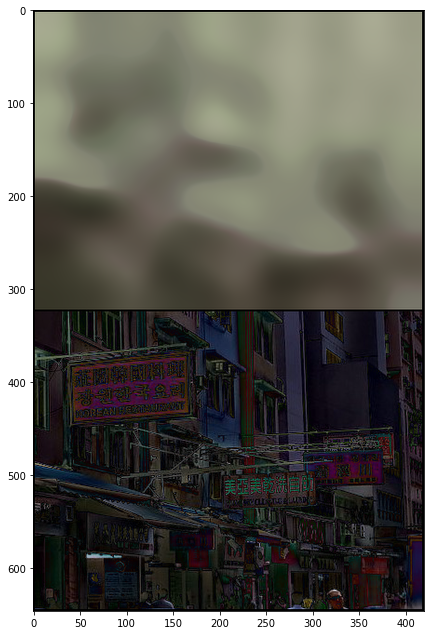

mean image 0.107284956


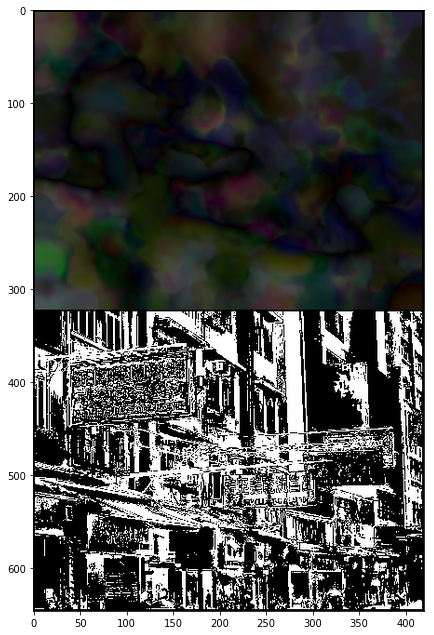

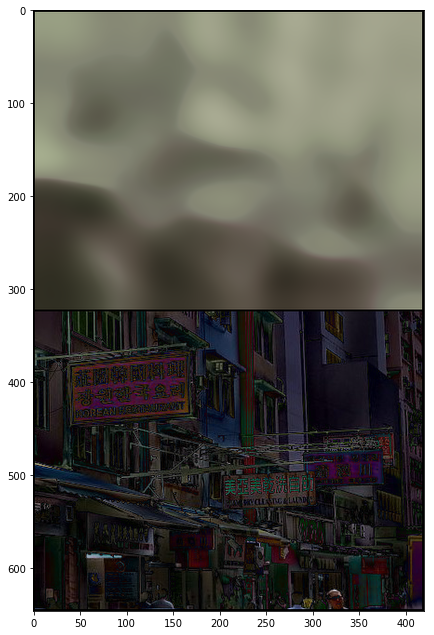

mean image 0.106728725


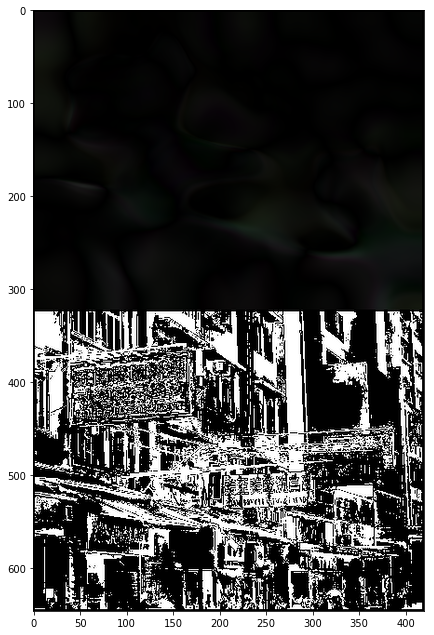

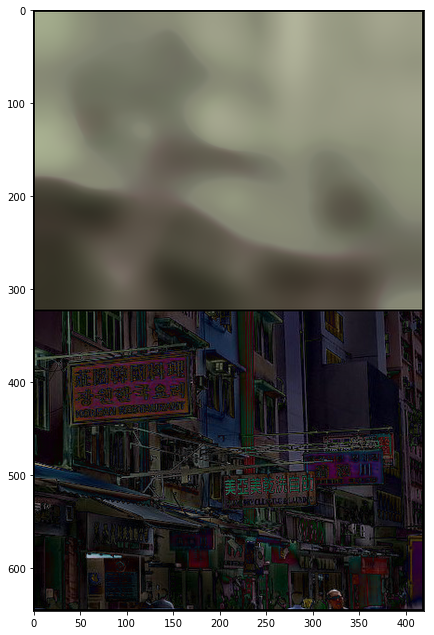

mean image 0.10717726


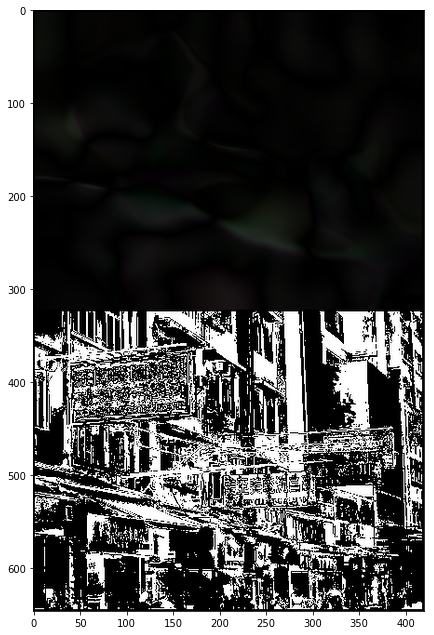

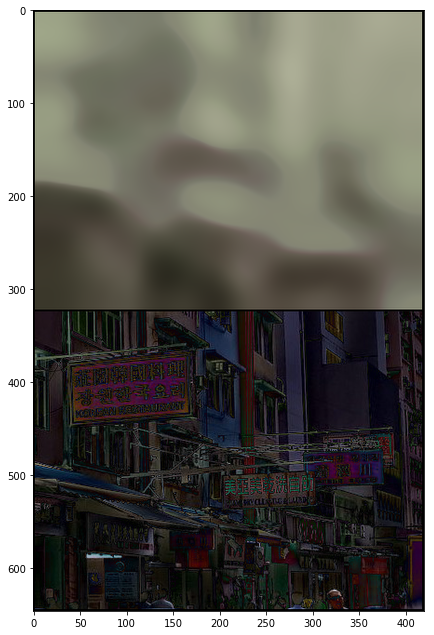

mean image 0.10595477


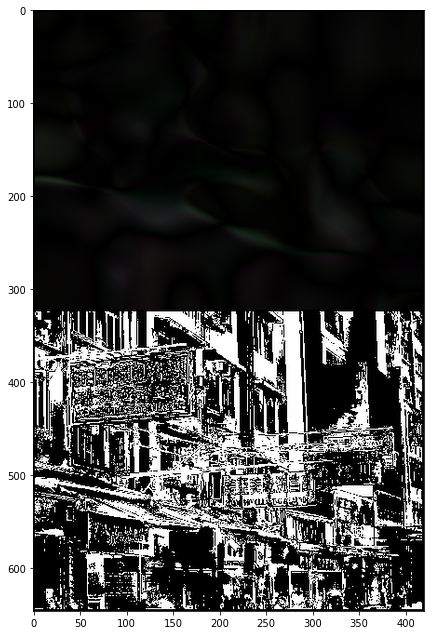

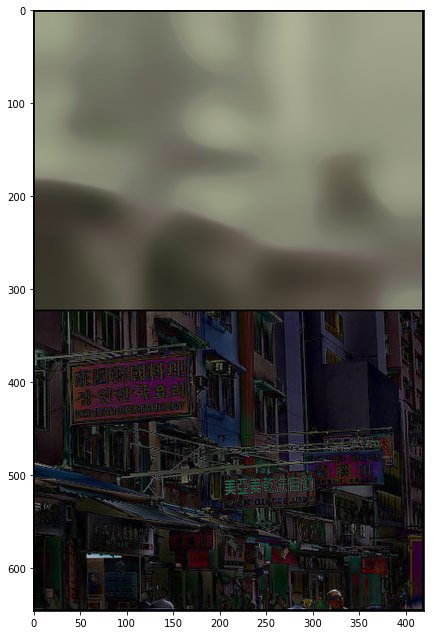

mean image 0.106433734


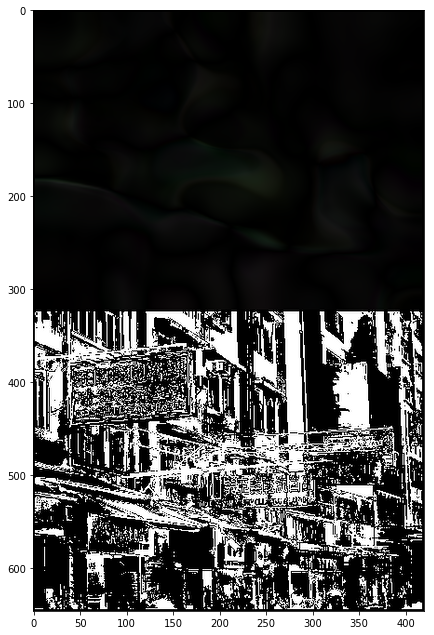

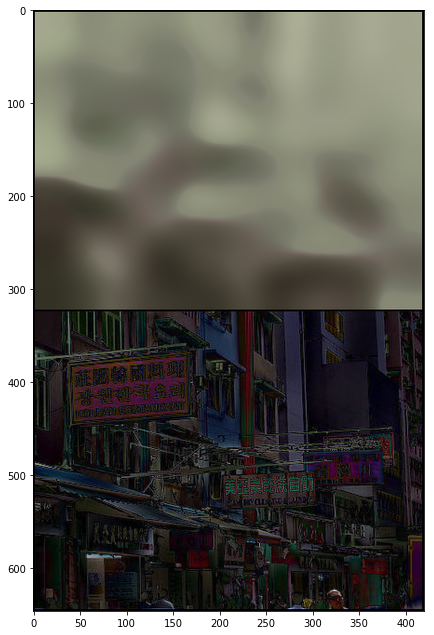

mean image 0.10653655


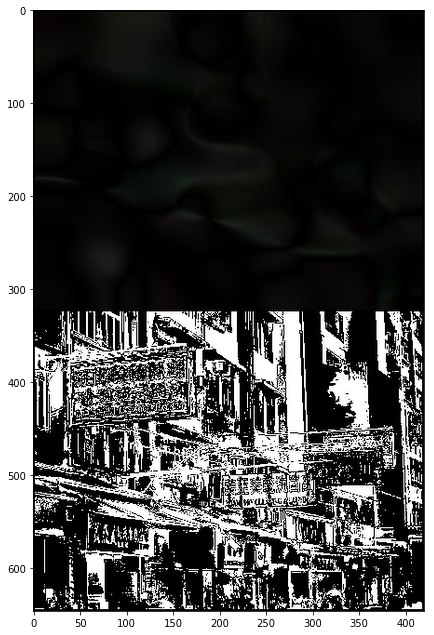

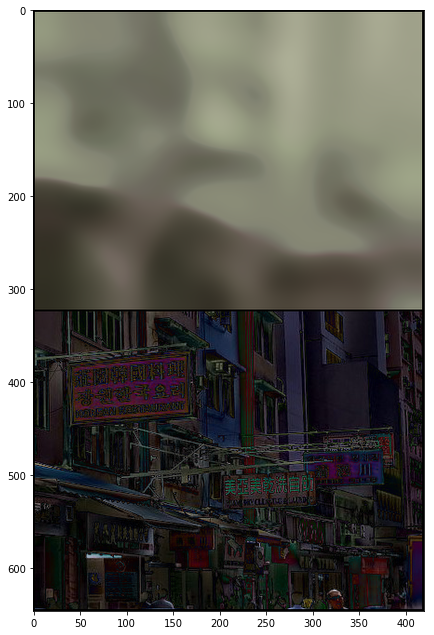

mean image 0.10644078


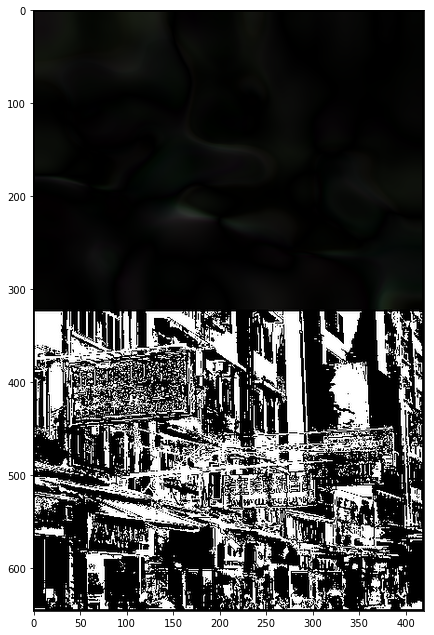

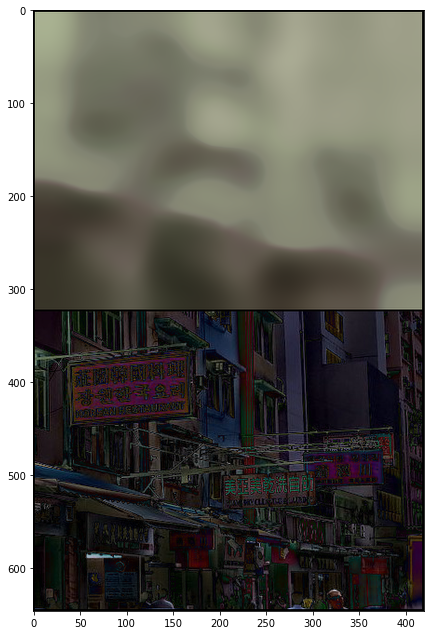

mean image 0.106249705


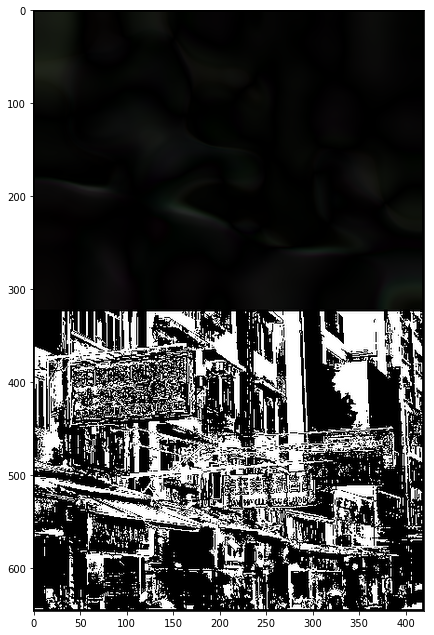

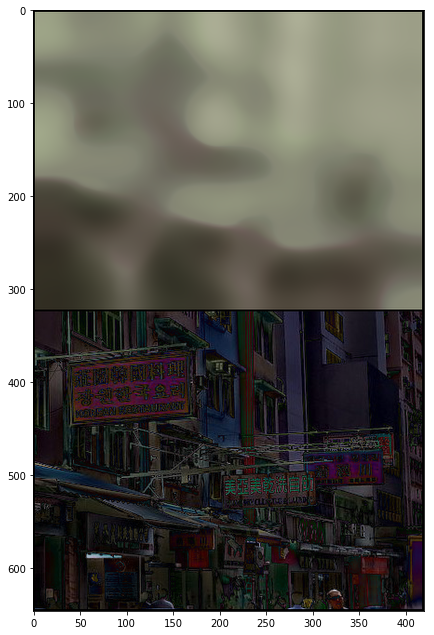

mean image 0.10719414


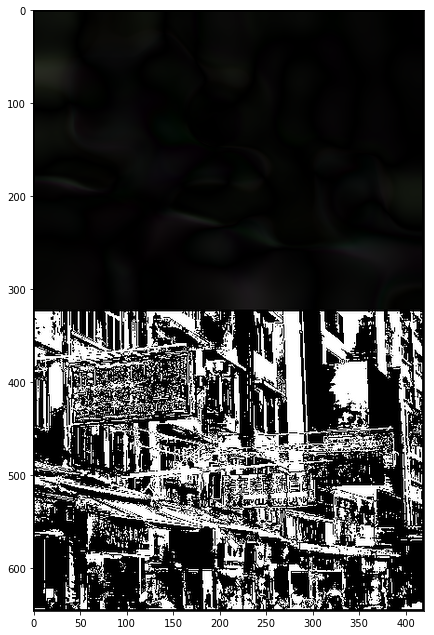

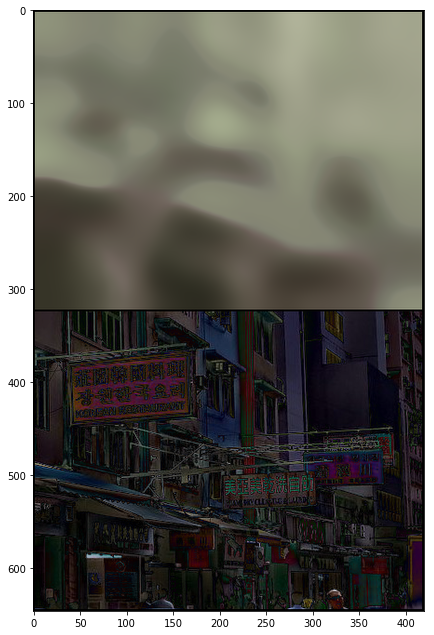

mean image 0.10638184


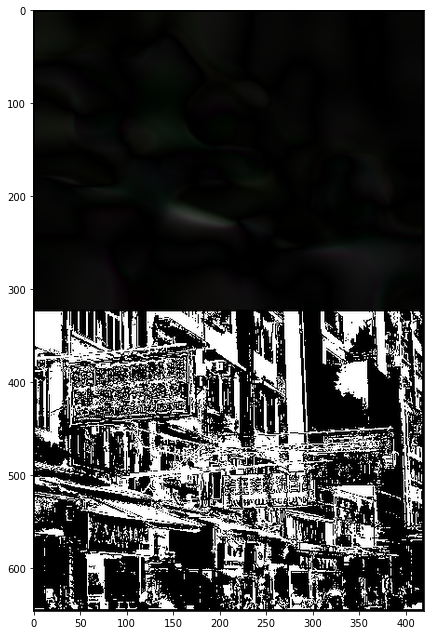

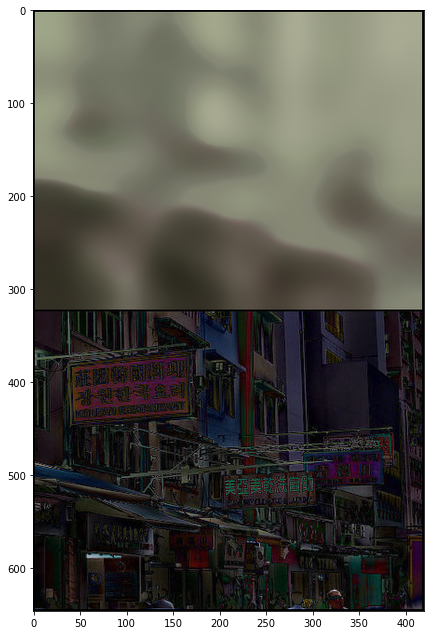

mean image 0.10678347


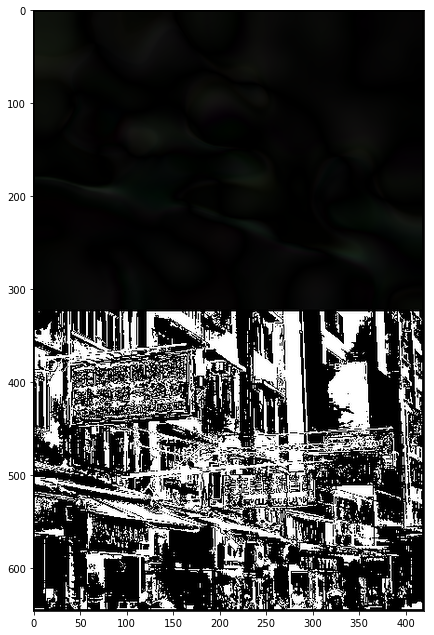

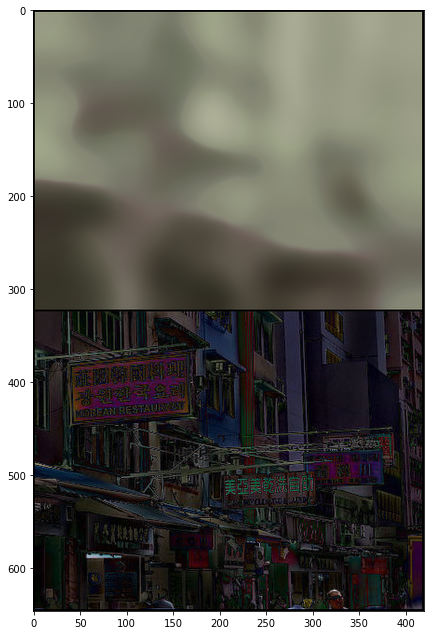

mean image 0.1057809


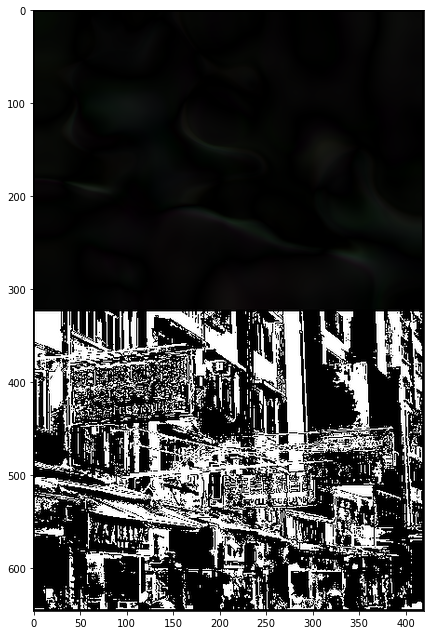

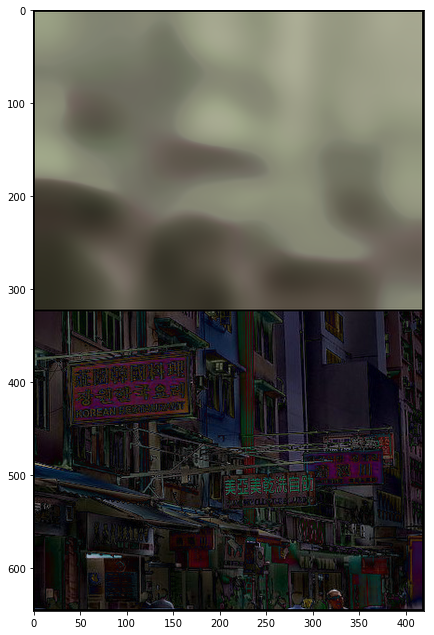

mean image 0.10642655


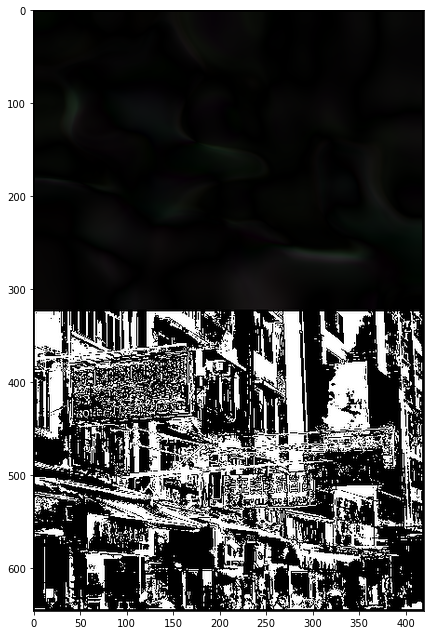

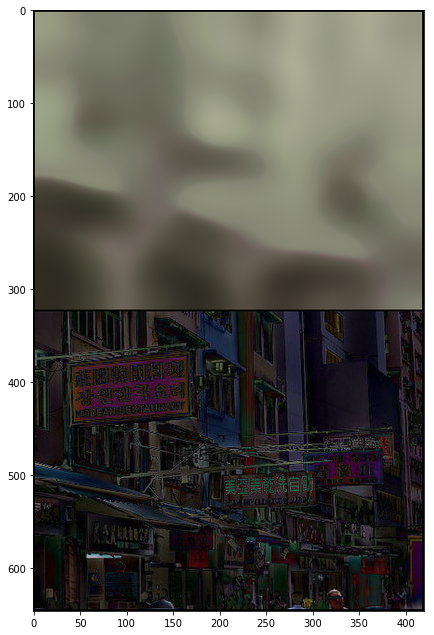

mean image 0.105778344


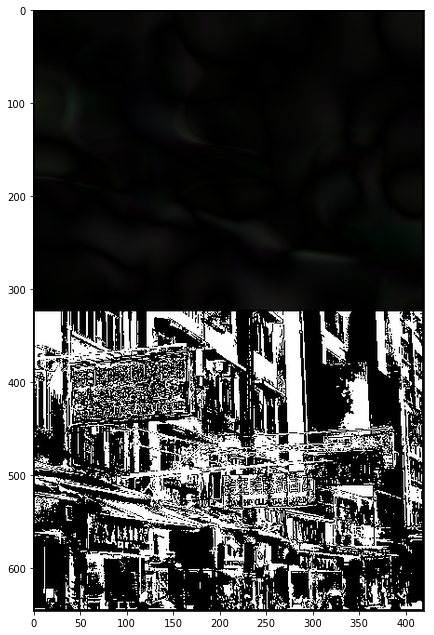

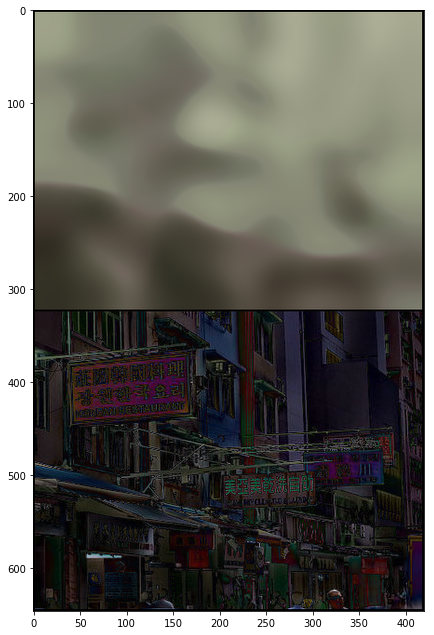

mean image 0.10635783


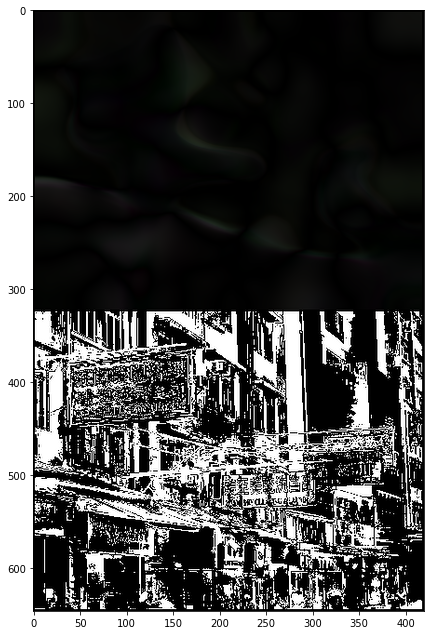

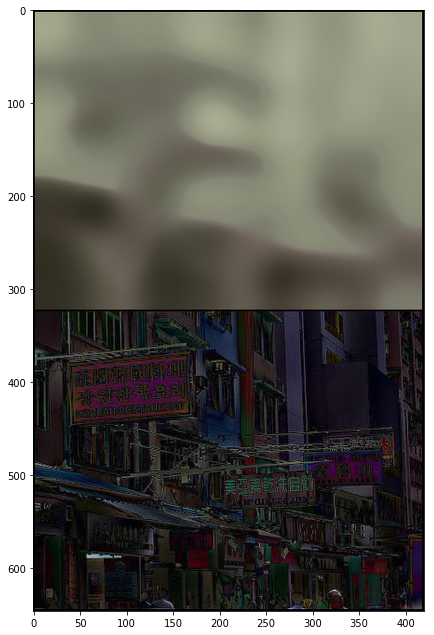

mean image 0.10660013


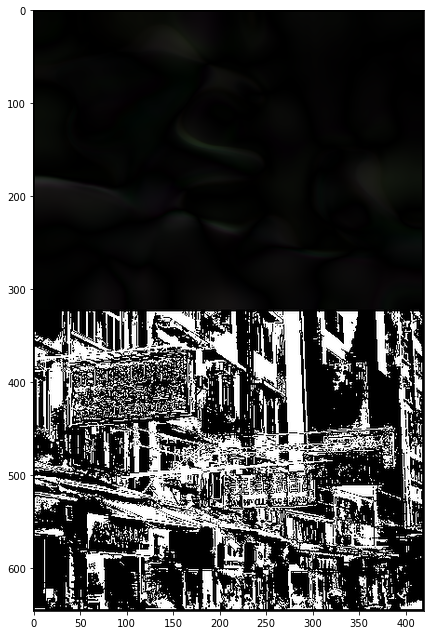

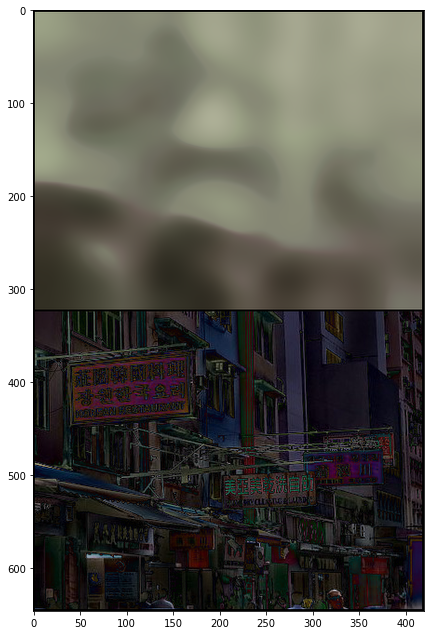

mean image 0.107025675


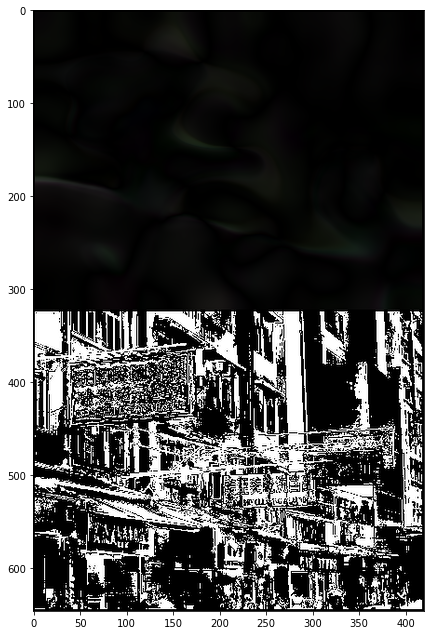

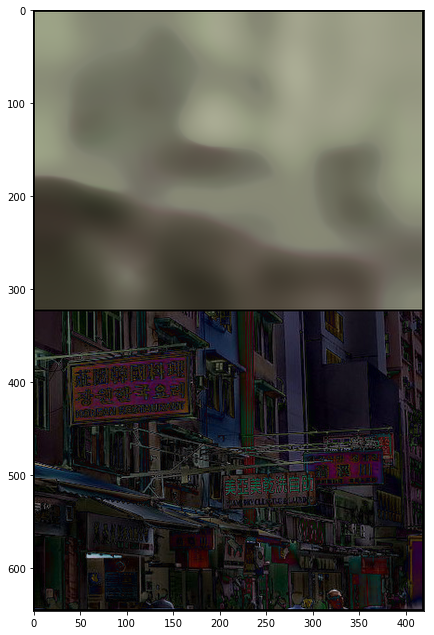

mean image 0.10580881


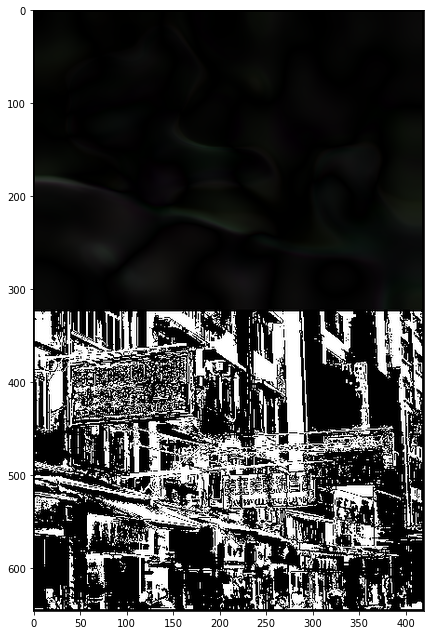

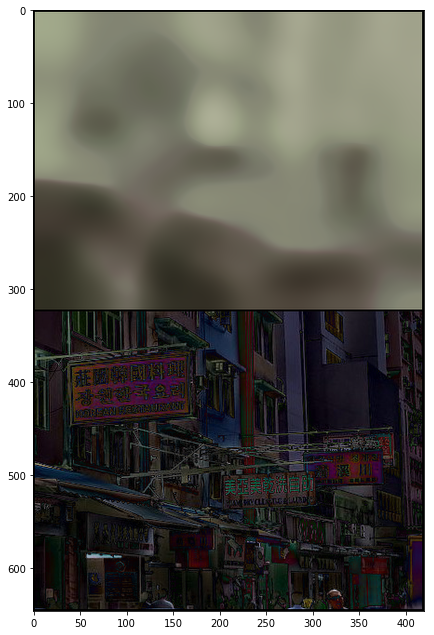

mean image 0.106095605


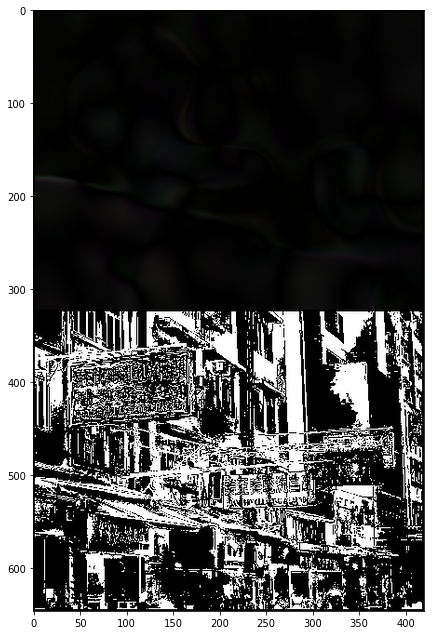

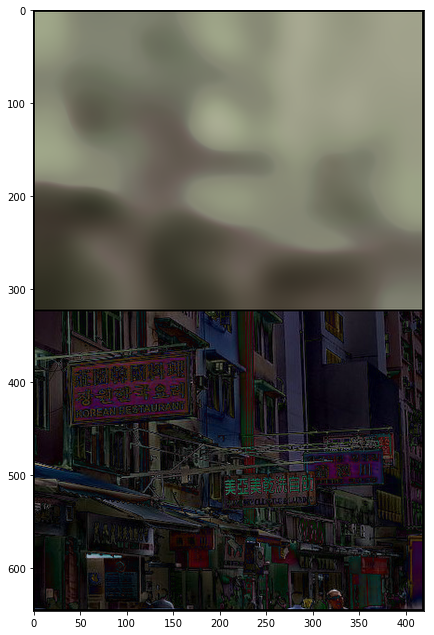

mean image 0.105999775


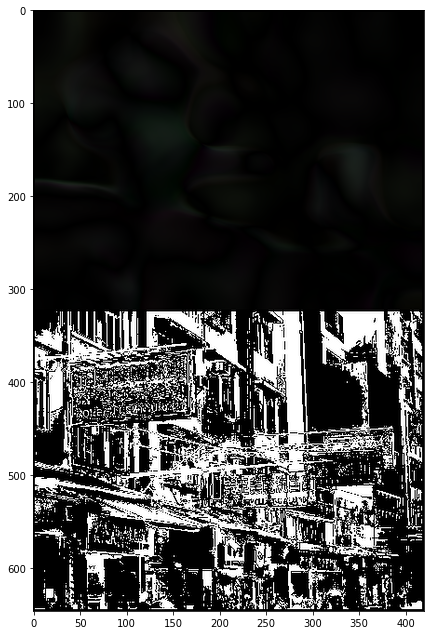

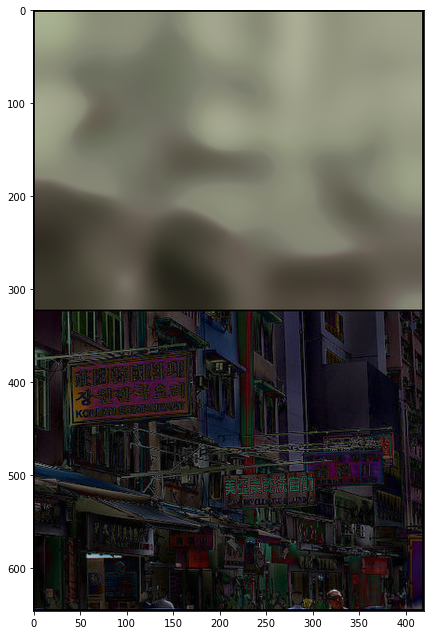

mean image 0.10734229


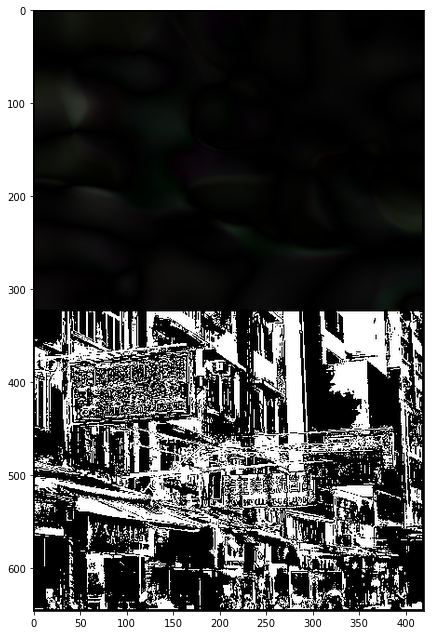

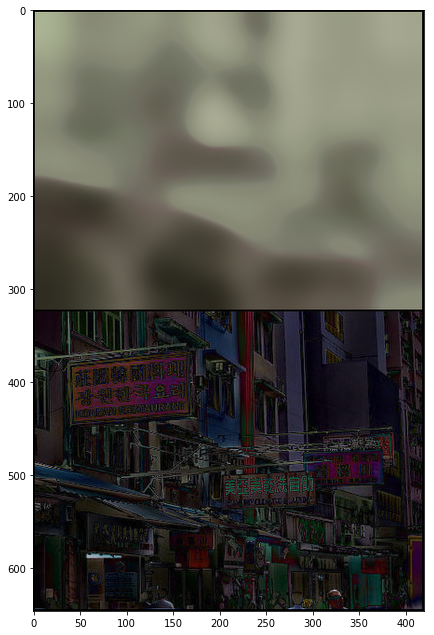

mean image 0.10663715


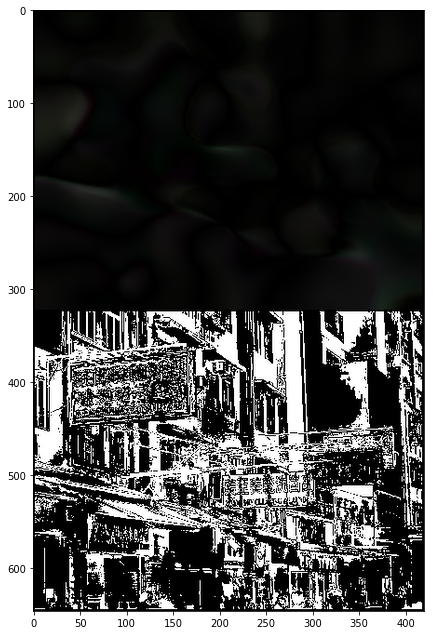

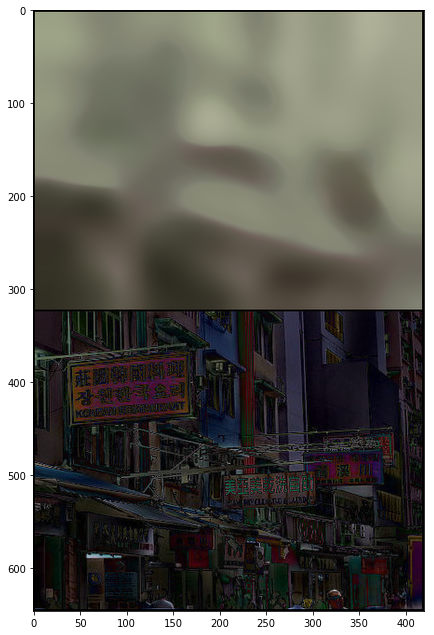

mean image 0.10691362


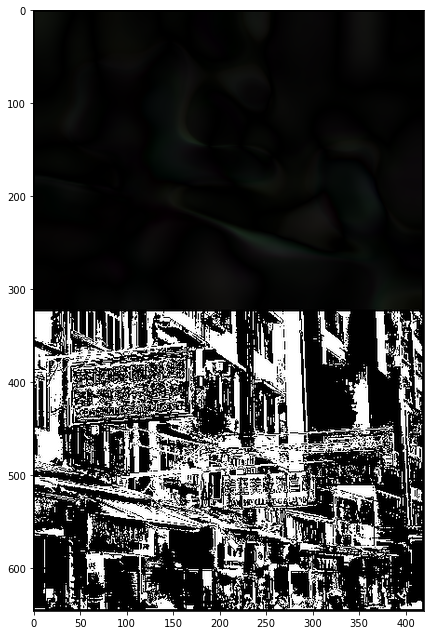

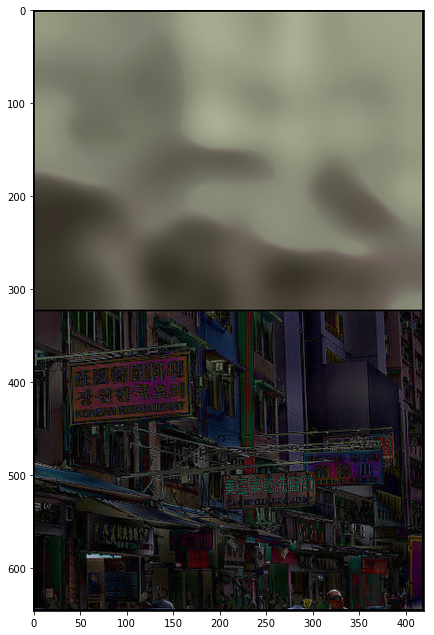

mean image 0.10858645


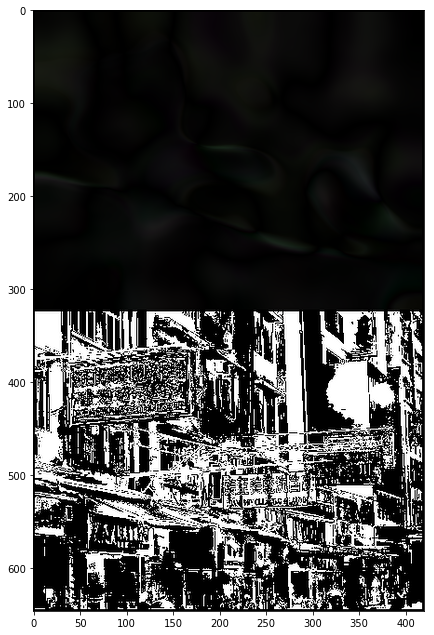

In [55]:
# Test the images by using pretrained alexnet model to predic classes
# instantiate pretrained alexnet 
import torchvision.models as t_models
import requests
LABELS_URL = 'https://s3.amazonaws.com/outcome-blog/imagenet/labels.json'

# Let's get our class labels.
response = requests.get(LABELS_URL)  # Make an HTTP GET request and store the response.
labels = {int(key): value for key, value in response.json().items()}

#print (labels)

# alexnet = t_models.alexnet(pretrained=True)

# alexnet.eval()
# alexnet = alexnet.double()

# img_np_normal = (img_np - np.reshape([0.485, 0.456, 0.406],(3,1,1))/np.reshape([0.229, 0.224, 0.225],(3,1,1)))
# predictions = np.argmax(torch_to_np(alexnet(torch.from_numpy(np.reshape(img_np_normal, (1,3,224,224))))))
# print (predictions, labels[predictions])


prev_out_np = img_np

net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()
out_avg = None
last_net = None
psrn_noisy_last = 0

i = 0
def closure():
    
    global i, out_avg, psrn_noisy_last, last_net, net_input, prev_out_np
    
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)
    
    out = net(net_input)
    
    # Smoothing
    if out_avg is None:
        out_avg = out.detach()
    else:
        out_avg = out_avg * exp_weight + out.detach() * (1 - exp_weight)
            
    total_loss = mse(out, img_noisy_torch)
    total_loss.backward()
        
    
    psrn_noisy = compare_psnr(img_noisy_np, out.detach().cpu().numpy()[0]) 
    psrn_gt    = compare_psnr(img_np, out.detach().cpu().numpy()[0]) 
    psrn_gt_sm = compare_psnr(img_np, out_avg.detach().cpu().numpy()[0]) 
    
    # Note that we do not have GT for the "snail" example
    # So 'PSRN_gt', 'PSNR_gt_sm' make no sense
    print ('Iteration %05d    Loss %f   PSNR_noisy: %f   PSRN_gt: %f PSNR_gt_sm: %f' % (i, total_loss.item(), psrn_noisy, psrn_gt, psrn_gt_sm), '\r', end='')
    if  PLOT and i % show_every == 0:
        out_np = torch_to_np(out)
        diffimage = np.abs(img_np-out_np)
        plot_image_grid([np.clip(out_np, 0, 1), 
                         np.clip(diffimage, 0, 1)], factor=figsize, nrow=1)
        print ('mean image',np.mean(diffimage))
        mask = diffimage >= 0.08
        diffimage[:,:,:] = 0
        #mask = (diffimage[0] >= 190 and diffimage[1] >= 190 and diffimage[2] >= 190) 
        #mask2 = diffimage<150
        diffimage[mask] = 1
        diffimage[:] = np.sum(diffimage, axis=0)
        mask2 = diffimage == 3
        diffimage[:,:,:] = 0
        diffimage[mask2] = 255
        plot_image_grid([np.clip(np.abs(out_np-prev_out_np), 0, 1),np.clip(diffimage, 0, 1)], factor=figsize, nrow=1)
        prev_out_np = out_np 
#         out_np_normal = (out_np - np.reshape([0.485, 0.456, 0.406],(3,1,1))/np.reshape([0.229, 0.224, 0.225],(3,1,1)))
#         alexnet = t_models.alexnet(pretrained=True)
#         alexnet = alexnet.double()
#         prediction = np.argmax(torch_to_np(alexnet(torch.from_numpy(np.reshape(out_np_normal, (1,3,224,224))))))
#         alexnet = alexnet.float()
#         prediction_unnormalized = np.argmax(torch_to_np(alexnet(torch.from_numpy(np.reshape(out_np, (1,3,224,224))))))
#         print ('Pretrained AlexNET classifier output:', prediction, labels[prediction], prediction_unnormalized, labels[prediction_unnormalized])
        
    
    # Backtracking
    if i % show_every:
        if psrn_noisy - psrn_noisy_last < -5: 
            print('Falling back to previous checkpoint.')

            for new_param, net_param in zip(last_net, net.parameters()):
                net_param.detach().copy_(new_param.cuda())

            return total_loss*0
        else:
            last_net = [x.detach().cpu() for x in net.parameters()]
            psrn_noisy_last = psrn_noisy
            
    i += 1

    return total_loss

p = get_params(OPT_OVER, net, net_input)
optimize(OPTIMIZER, p, closure, LR, num_iter)

C:\Anaconda2\envs\CS682\lib\site-packages\torch\nn\modules\upsampling.py:122: UserWarning: nn.Upsampling is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.Upsampling is deprecated. Use nn.functional.interpolate instead.")
C:\Anaconda2\envs\CS682\lib\site-packages\torch\nn\functional.py:1961: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


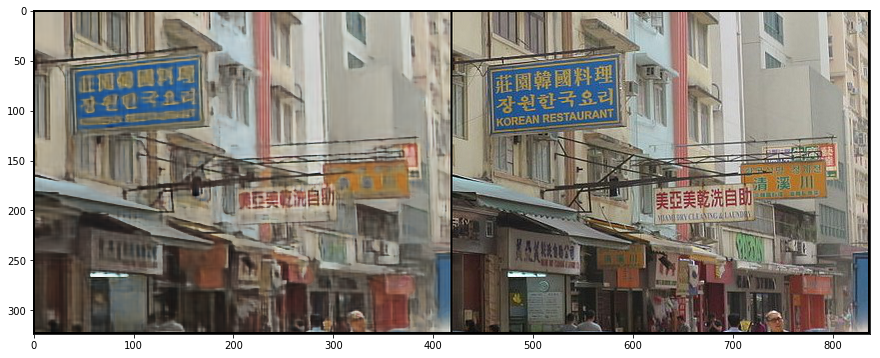

In [47]:
out_np = torch_to_np(net(net_input))
q = plot_image_grid([np.clip(out_np, 0, 1), img_np], factor=13);
